# Data vizualization and plotting


### Set Up

In [81]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import laspy
import open3d as o3d
from src.data.dataset import Scene, CameraRadarProps
from src.radar_to_image import multi_radar_to_img, single_radar_to_img
from sklearn.cluster import DBSCAN
from sklearn import metrics

# import pptk
#data path
camera_load_path = 'data/camera_intrinsics.npy'
data_load_path = 'data/00000.npz'
matrices_path = 'data/extrinsics_intrinsics.npz'

## Load data and print shape


In [4]:
# Load data from specified paths with allow_pickle=True for object arrays
data = np.load(data_load_path, allow_pickle=True)
matrices = np.load(matrices_path, allow_pickle=True)

# Print keys of the loaded data dictionaries
print("Data keys:", data.files)
print("Matrices keys:", matrices.files)

# Access specific data entries
camera = data['camera_frames'].item()
camera_extrinsics = matrices['camera_extrinsics']

# Print shapes for verification
print("Camera frames keys:", camera_frames.keys())
print("Camera extrinsics shape:", camera_extrinsics.shape)

Data keys: ['lidar_extrinsic', 'camera_frames', 'lidar_points', 'radar_points', 'timestamp']
Matrices keys: ['lidar_extrinsic', 'radar_extrinsics', 'camera_extrinsics', 'camera_intrinsics']
Camera frames keys: dict_keys(['20438665', '21248038', '21248039'])
Camera extrinsics shape: ()


# Camera

In [5]:
# Print keys of the 'camera' dictionary
print("Camera keys:", camera.keys())
print("Shape of '20438665' data:", camera['20438665'].shape)

Camera keys: dict_keys(['20438665', '21248038', '21248039'])
Shape of '20438665' data: (1240, 1616, 3)


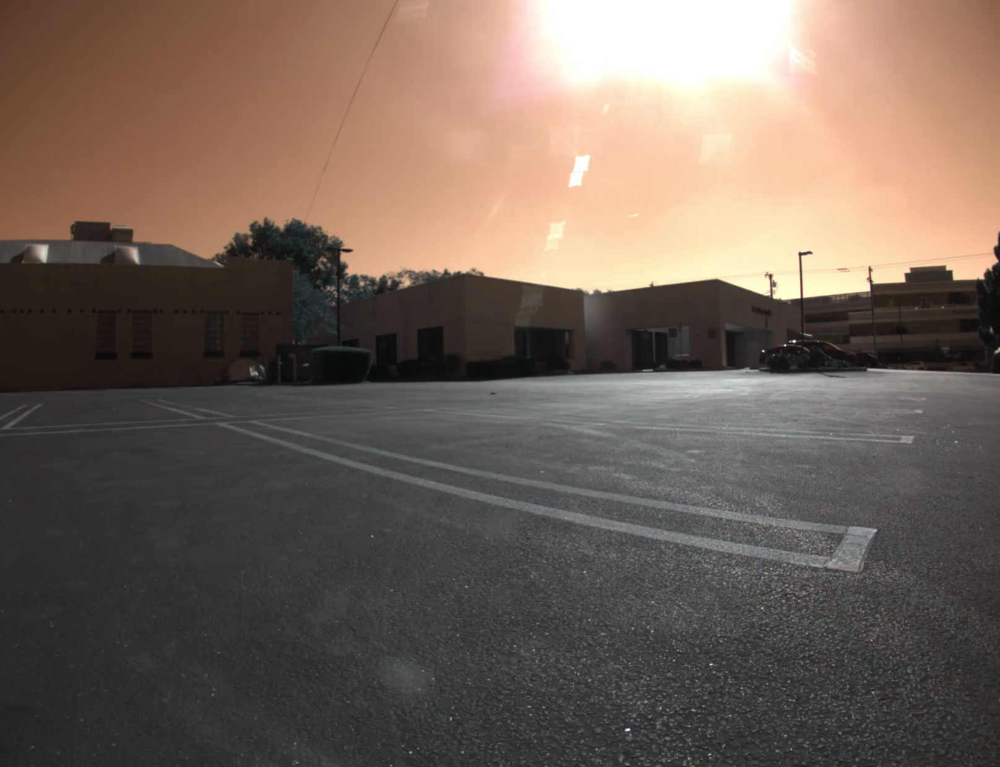

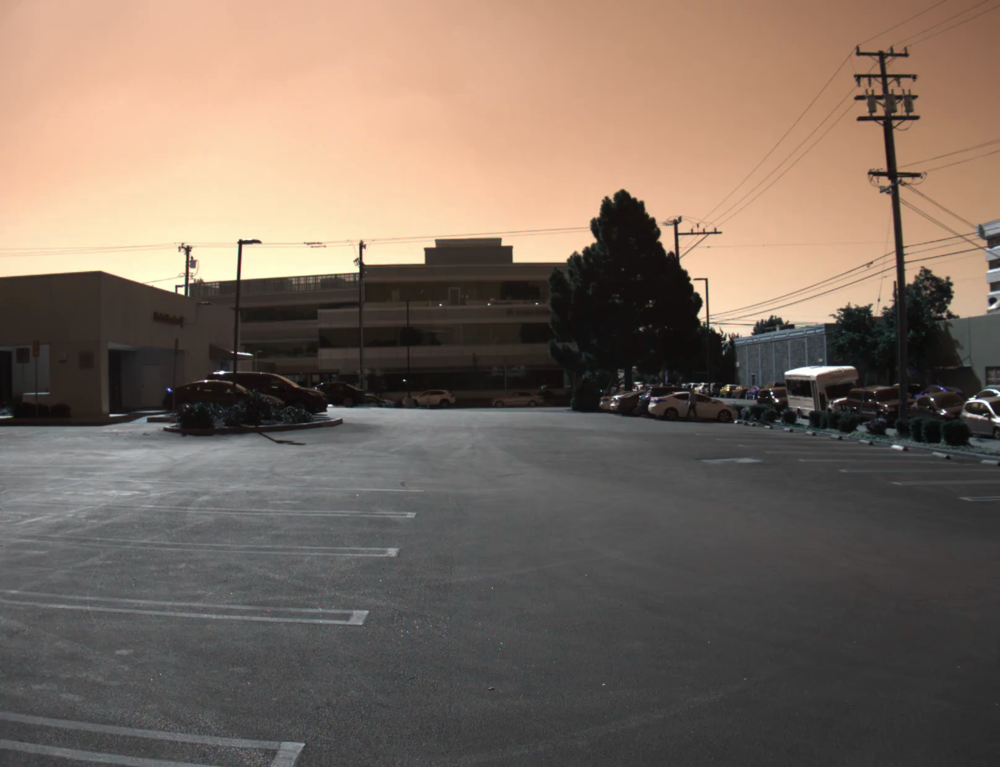

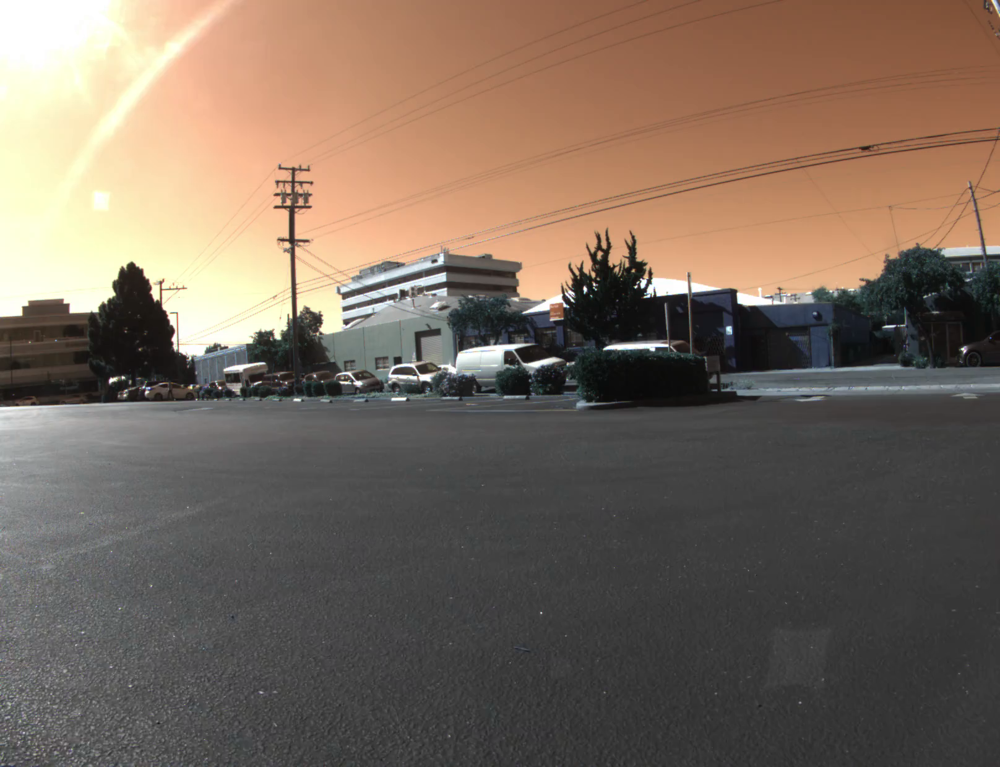

In [6]:
# display image
display(Image.fromarray(camera['21248038']))
display(Image.fromarray(camera['20438665']))
display(Image.fromarray(camera['21248039']))

# Lidar

## Extrinsic

In [7]:
# Access the 'lidar_extrinsic' matrix
lidar_extrinsics = data['lidar_extrinsic']

# Print the 'lidar_extrinsic' matrix
print(lidar_extrinsics)

[[ 0.02442975 -0.99872376  0.04420451 -2.3342    ]
 [ 0.9996051   0.0250177   0.01279649 -0.03      ]
 [-0.01388605  0.04387444  0.99894054  1.4       ]]


## Points

In [8]:
# Access the 'lidar_points' data
lidar_pt = data['lidar_points']
print("Lidar point cloud shape:", lidar_pt.shape)

# Create an Open3D point cloud object
pcd = o3d.geometry.PointCloud()

# Set the points of the point cloud
pcd.points = o3d.utility.Vector3dVector(lidar_pt)

# Visualize the point cloud using Open3D
o3d.visualization.draw_geometries([pcd])

Lidar point cloud shape: (69545, 3)
[Open3D WARNING] GLFW Error: Cocoa: Failed to find service port for display
[Open3D WARNING] GLFW Error: Cocoa: Failed to find service port for display
[Open3D WARNING] GLFW Error: Cocoa: Failed to find service port for display
[Open3D WARNING] GLFW Error: Cocoa: Failed to find service port for display


2024-05-23 22:22:10.967 Python[72396:4569038] WARNING: Secure coding is automatically enabled for restorable state! However, not on all supported macOS versions of this application. Opt-in to secure coding explicitly by implementing NSApplicationDelegate.applicationSupportsSecureRestorableState:.


# Radar

In [9]:
radar_pt = data['radar_points'].item()
print("Radar point cloud keys:", radar_pt.keys())
# Combine radar point clouds into a single array
radar_all = np.vstack([radar_pt['ZRVC2001'], radar_pt['ZRVE1001'], radar_pt['ZRVE1002']])

# Create an Open3D point cloud object
radar_pcd = o3d.geometry.PointCloud()

# Set the points of the point cloud
radar_pcd.points = o3d.utility.Vector3dVector(radar_all)

# Visualize the radar point cloud using Open3D
o3d.visualization.draw_geometries([radar_pcd])

Radar point cloud keys: dict_keys(['ZRVE1001', 'ZRVC2001', 'ZRVE1002'])
[Open3D WARNING] GLFW Error: Cocoa: Failed to find service port for display
[Open3D WARNING] GLFW Error: Cocoa: Failed to find service port for display


# Transformation

## Extrinsics - map: sensor --> vehicle

In [10]:
# access radar extrinsics
radar_extrinsic = matrices['radar_extrinsics'].item()

# Extract rotation (R) and translation (T) matrices for each radar sensors
ZRVE1001 = radar_extrinsic['ZRVE1001']
ZRVE1001_R = ZRVE1001[:, :3]
ZRVE1001_T = ZRVE1001[:, 3]

ZRVC2001 = radar_extrinsic['ZRVC2001']
ZRVC2001_R = ZRVC2001[:, :3]
ZRVC2001_T = ZRVC2001[:, 3]

ZRVE1002 = radar_extrinsic['ZRVE1002']
ZRVE1002_R = ZRVE1002[:, :3]
ZRVE1002_T = ZRVE1002[:, 3]

# Extract LIDAR rotation (R) and translation (T) matrices
LIDAR_R = lidar_extrinsics[:, :3]
LIDAR_T = lidar_extrinsics[:, 3]

# Access camera extrinsics and intrinsics
camera_ex = matrices['camera_extrinsics']
camera_in = matrices['camera_intrinsics']

# Apply extrinsics to radar points
ZRVE1001_pt = ZRVE1001_R @ radar_pt['ZRVE1001'].T + ZRVE1001_T[:, None]
ZRVC2001_pt = ZRVC2001_R @ radar_pt['ZRVC2001'].T + ZRVC2001_T[:, None]
ZRVE1002_pt = ZRVE1002_R @ radar_pt['ZRVE1002'].T + ZRVE1002_T[:, None]

# Apply extrinsics to LIDAR points
LIDAR_pt = LIDAR_R @ lidar_pt.T + LIDAR_T[:, None]

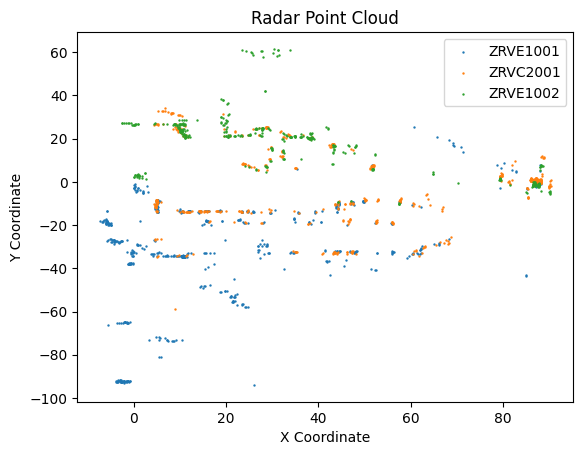

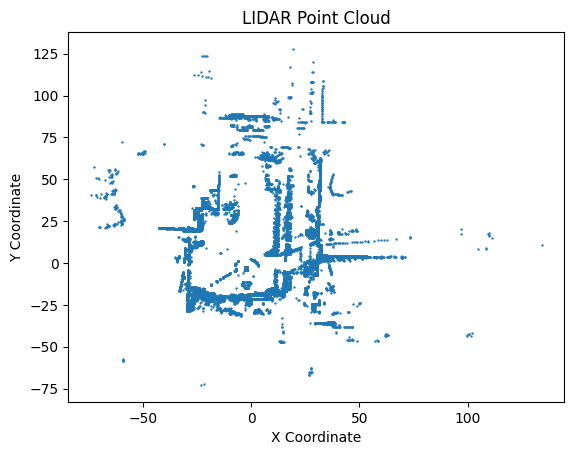

In [13]:
# Plot radar points with scatter plot
plt.scatter(ZRVE1001_pt[0, :], ZRVE1001_pt[1, :], s=0.5, label='ZRVE1001')
plt.scatter(ZRVC2001_pt[0, :], ZRVC2001_pt[1, :], s=0.5, label='ZRVC2001')
plt.scatter(ZRVE1002_pt[0, :], ZRVE1002_pt[1, :], s=0.5, label='ZRVE1002')

plt.legend()
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')
plt.title('Radar Point Cloud')
plt.show()

# Plot LIDAR points with scatter plot
plt.scatter(LIDAR_pt[0, :], LIDAR_pt[1, :], s=0.5)

# Add labels and title to the plot
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')
plt.title('LIDAR Point Cloud')
plt.show()

In [33]:
# Reverse the x, y axis for radar and stack the points
ZRVE1001_global = np.vstack((-ZRVE1001_pt[1, :], ZRVE1001_pt[0, :], ZRVE1001_pt[2, :])).T
ZRVC2001_global = np.vstack((-ZRVC2001_pt[1, :], ZRVC2001_pt[0, :], ZRVC2001_pt[2, :])).T
ZRVE1002_global = np.vstack((-ZRVE1002_pt[1, :], ZRVE1002_pt[0, :], ZRVE1002_pt[2, :])).T

# Create Open3D point cloud objects for each radar set
pcd_1001 = o3d.geometry.PointCloud()
pcd_1001.points = o3d.utility.Vector3dVector(ZRVE1001_global)
pcd_1001.colors = o3d.utility.Vector3dVector(np.tile([1, 0, 0], (ZRVE1001_global.shape[0], 1)))  # Red color

pcd_2001 = o3d.geometry.PointCloud()
pcd_2001.points = o3d.utility.Vector3dVector(ZRVC2001_global)
pcd_2001.colors = o3d.utility.Vector3dVector(np.tile([0, 1, 0], (ZRVC2001_global.shape[0], 1)))  # Green color

pcd_1002 = o3d.geometry.PointCloud()
pcd_1002.points = o3d.utility.Vector3dVector(ZRVE1002_global)
pcd_1002.colors = o3d.utility.Vector3dVector(np.tile([0, 0, 1], (ZRVE1002_global.shape[0], 1)))  # Blue color

# Combine all point clouds for visualization
combined_pcd = pcd_1001 + pcd_2001 + pcd_1002

# Visualize the combined point clouds
o3d.visualization.draw_geometries([combined_pcd])

[Open3D WARNING] GLFW Error: Cocoa: Failed to find service port for display
[Open3D WARNING] GLFW Error: Cocoa: Failed to find service port for display


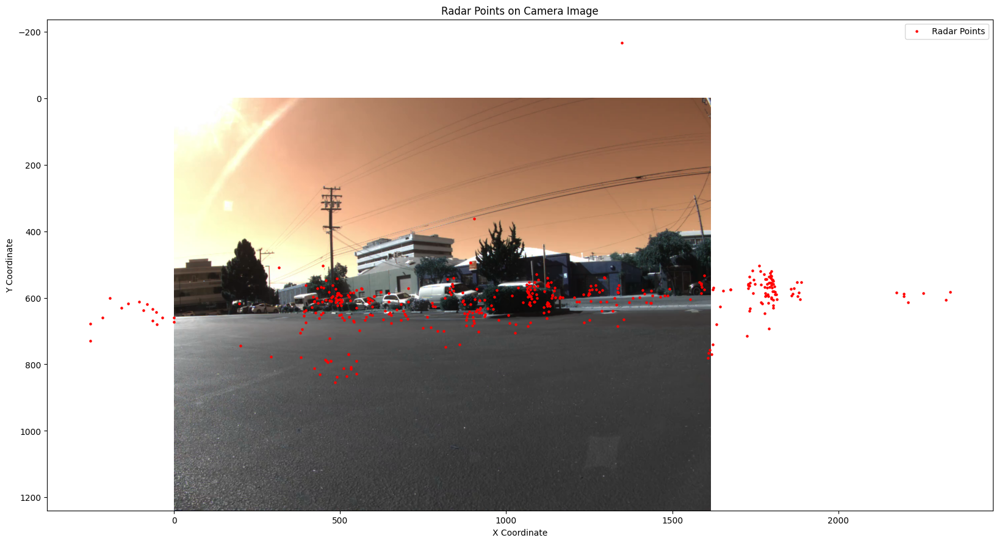

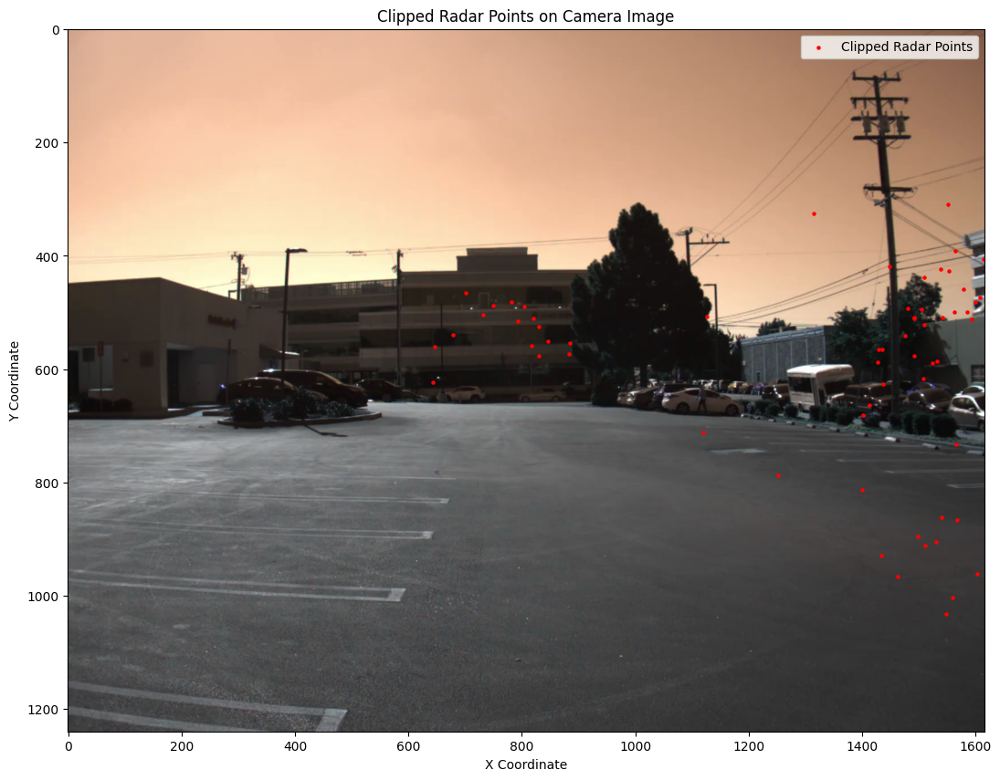

In [56]:
def radar_to_vehicle(radar_pc, radar_extrinsics):
    # Convert radar points to homogeneous coordinates (N x 4)
    homogenous_radar_pc = np.append(radar_pc, [[1]] * len(radar_pc), axis=1)
    # Transform radar points to vehicle coordinates (3x4 matrix @ 4xN matrix = 3xN matrix)
    vehicle_coordinates = radar_extrinsics @ homogenous_radar_pc.T
    # Reverse the x and y axes for the radar points and stack them
    radar_vehicle = np.vstack((-vehicle_coordinates[1, :], vehicle_coordinates[0, :], vehicle_coordinates[2, :]))
    return radar_vehicle.T

def vehicle_to_camera(vehicle_pc, camera_extrinsics):
    # Add a row to convert camera extrinsics to homogeneous coordinates (4x4 matrix)
    camera_extrinsics_hom = np.vstack((camera_extrinsics, [[0, 0, 0, 1]]))
    # Compute the inverse of the camera extrinsics matrix
    camera_extrinsics_hom_inv = np.linalg.inv(camera_extrinsics_hom)
    # Convert vehicle points to homogeneous coordinates (N x 4)
    homogenous_vehicle_pc = np.append(vehicle_pc, [[1]] * len(vehicle_pc), axis=1)
    # Transform vehicle points to camera coordinates (4x4 matrix @ 4xN matrix = 4xN matrix)
    camera_coordinates = camera_extrinsics_hom_inv @ homogenous_vehicle_pc.T
    return camera_coordinates.T

def camera_to_image(camera_pt, camera_intrinsics):
    # Decompose the intrinsics into matrix and distortion coefficients
    in_matrix, distortion = camera_intrinsics
    # Convert intrinsics matrix to homogeneous coordinates (3x4 matrix)
    in_matrix_hom = np.hstack((in_matrix, [[1]] * 3))
    # Transform camera points to image coordinates (3x4 matrix @ 4xN matrix = 3xN matrix)
    image_coordinates = in_matrix_hom @ camera_pt.T
    # Normalize the image coordinates by dividing x, y by z
    image_coordinates = image_coordinates / image_coordinates[2, :]
    # Extract x and y coordinates (N x 2)
    image_coordinates = image_coordinates[:2, :].T
    return image_coordinates

def radar_to_img(radar_pt, radar_extrinsics, camera_extrinsics, camera_intrinsics):
    radar_vehicle = radar_to_vehicle(radar_pt, radar_extrinsics)
    camera_coor = vehicle_to_camera(radar_vehicle, camera_extrinsics)
    image_coor = camera_to_image(camera_coor, camera_intrinsics)
    x, y = image_coor[:, 0], image_coor[:, 1]
    return x, y

# Transform radar points to vehicle coordinates
radar_vehicle = radar_to_vehicle(radar_pt['ZRVE1002'], radar_extrinsic['ZRVE1002'])
# Transform vehicle coordinates to camera coordinates using camera extrinsics
camera_coor = vehicle_to_camera(radar_vehicle, camera_ex.item()['21248039'])
# Transform camera coordinates to image coordinates using camera intrinsics
image_coor = camera_to_image(camera_coor, camera_in.item()['21248039'])

# Convert image data to float32 and normalize
camera_image = camera['21248039'].astype(np.float32) / 255.0

# Plot the image
plt.figure(figsize=(20, 20))
plt.imshow(camera_image)
plt.title('Radar Points on Camera Image')
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')

# Scatter plot of radar points on the image
plt.scatter(image_coor[:, 0], image_coor[:, 1], color='red', s=5, label='Radar Points')
plt.legend()
plt.show()

# Convert image data to float32 and normalize
camera_image = camera['20438665'].astype(np.float32) / 255.0

# Define the boundaries for clipping the points
image_width = 1616
image_height = 1240

# Clip the radar points to be within the image boundaries
clipped_points = [(i, j) for i, j in zip(x, y) if 0 < i < image_width and 0 < j < image_height]

# Extract the clipped x and y coordinates
clipped_x = [p[0] for p in clipped_points]
clipped_y = [p[1] for p in clipped_points]

# Plot the image
plt.figure(figsize=(20, 10))
plt.imshow(camera_image)
plt.title('Clipped Radar Points on Camera Image')
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')

# Scatter plot of clipped radar points on the image
plt.scatter(clipped_x, clipped_y, color='red', s=5, label='Clipped Radar Points')
plt.legend()
plt.show()

Loading data for: data/00000.npz
Loading camera frames.


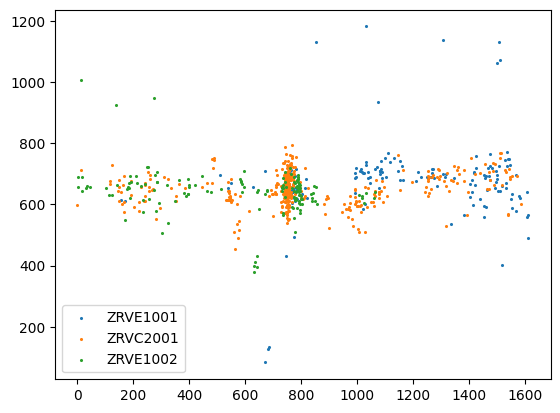

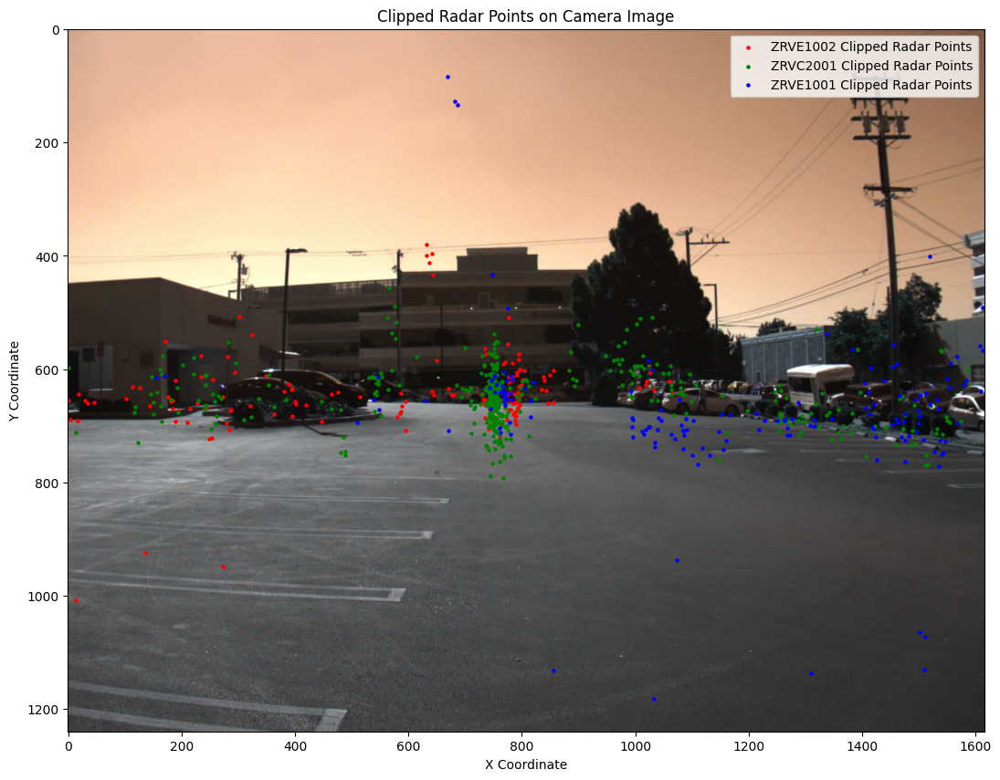

In [67]:
# Plot the image with radar points from all sensors

LEFT_CAM = '21248038'
MID_CAM = '20438665'
RIGHT_CAM = '21248039'

LEFT_RADAR = 'ZRVE1002'
MID_RADAR = 'ZRVC2001'
RIGHT_RADAR = 'ZRVE1001'

filepath = 'data/00000.npz'
sensor_prop_path = 'data/extrinsics_intrinsics.npz'

if __name__ == '__main__':

    # Load the data
    data = Scene(filepath)
    sensor_props = CameraRadarProps(sensor_prop_path)

    # Get radar and camera data
    radar_data = data.get_radar_data()
    camera_data = data.get_camera_data()
    cam = MID_CAM

    # Get all radar points transformed to image coordinates
    all_radar = multi_radar_to_img(
        radar_data,
        sensor_props.radar_extrinsic, 
        sensor_props.camera_extrinsics[cam], 
        sensor_props.camera_intrinsics[cam],
        image=camera_data[cam]
    )

    # Initialize lists to hold all clipped points
    clipped_points_dict = {LEFT_RADAR: [], MID_RADAR: [], RIGHT_RADAR: []}

    # Define the boundaries for clipping the points
    image_width = 1616
    image_height = 1240

    # Process each radar sensor's points
    for key, points in all_radar.items():
        x, y = points[:, 0], points[:, 1]
        # Clip the radar points to be within the image boundaries
        clipped_points = [(i, j) for i, j in zip(x, y) if 0 < i < image_width and 0 < j < image_height]
        clipped_points_dict[key] = clipped_points

    # Convert the image data to float32 and normalize
    camera_image = camera_data[cam].astype(np.float32) / 255.0

    # Define colors for each radar
    radar_colors = {LEFT_RADAR: 'red', MID_RADAR: 'green', RIGHT_RADAR: 'blue'}

    # Plot the image and overlay the clipped radar points
    plt.figure(figsize=(20, 10))
    plt.imshow(camera_image)
    plt.title('Clipped Radar Points on Camera Image')
    plt.xlabel('X Coordinate')
    plt.ylabel('Y Coordinate')

    # Scatter plot of clipped radar points on the image for each radar
    for radar, points in clipped_points_dict.items():
        if points:  # Only plot if there are points
            x, y = zip(*points)
            plt.scatter(x, y, color=radar_colors[radar], s=5, label=f'{radar} Clipped Radar Points')

    # Add legend
    plt.legend()

    # Display the plot
    plt.show()


# RADAR CLUSTERING

# 2D clusters for concatenated radar

Silhouette Coefficient: 0.410
Estimated number of clusters: 12
Estimated number of noise points: 88


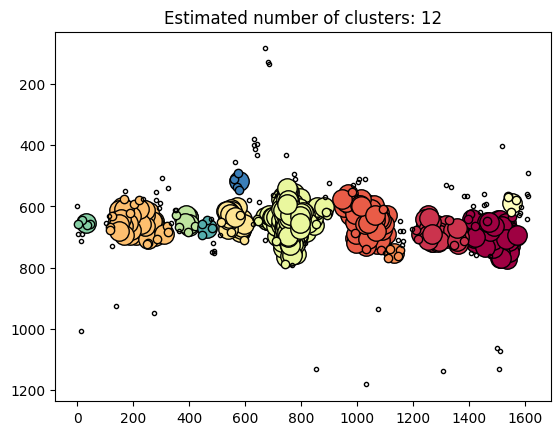

In [82]:
# Concatenate all radar points into a single array
X = np.concatenate((all_radar['ZRVE1001'], all_radar['ZRVE1002'], all_radar['ZRVC2001']))

# Apply DBSCAN clustering algorithm
db = DBSCAN(eps=30, min_samples=5).fit(X)
labels = db.labels_

# Calculate and print the Silhouette Coefficient
silhouette_score = metrics.silhouette_score(X, labels)
print(f"Silhouette Coefficient: {silhouette_score:.3f}")

# Calculate the number of clusters (excluding noise) and noise points
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

# Print the estimated number of clusters and noise points
print(f"Estimated number of clusters: {n_clusters_}")
print(f"Estimated number of noise points: {n_noise_}")

# Initialize core samples mask
core_samples_mask = np.zeros_like(labels, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True

# Generate unique colors for each cluster
unique_labels = set(labels)
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]

# Plot each cluster with different color
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 0]
        marker = '.'
    else:
        marker = 'o'
    
    class_member_mask = labels == k

    # Plot core samples
    xy = X[class_member_mask & core_samples_mask]
    plt.plot(
        xy[:, 0], xy[:, 1], marker,
        markerfacecolor=tuple(col),
        markeredgecolor='k',
        markersize=14
    )

    # Plot non-core samples
    xy = X[class_member_mask & ~core_samples_mask]
    plt.plot(
        xy[:, 0], xy[:, 1], marker,
        markerfacecolor=tuple(col),
        markeredgecolor='k',
        markersize=6
    )

# Title and inversion of y-axis for the plot
plt.title(f"Estimated number of clusters: {n_clusters_}")
ax = plt.gca()
ax.invert_yaxis()
plt.show()


Loading data for: data/00000.npz
Loading camera frames.
Silhouette Coefficient: 0.410
Estimated number of clusters: 12
Estimated number of noise points: 88


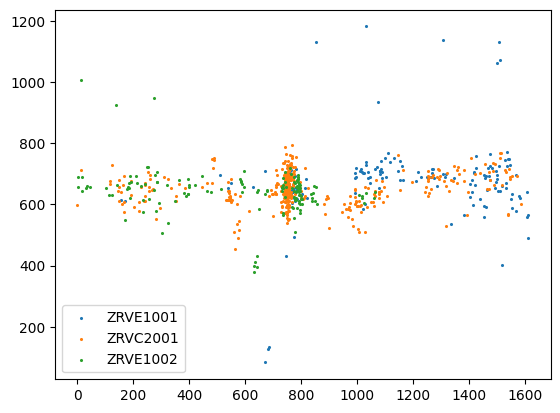

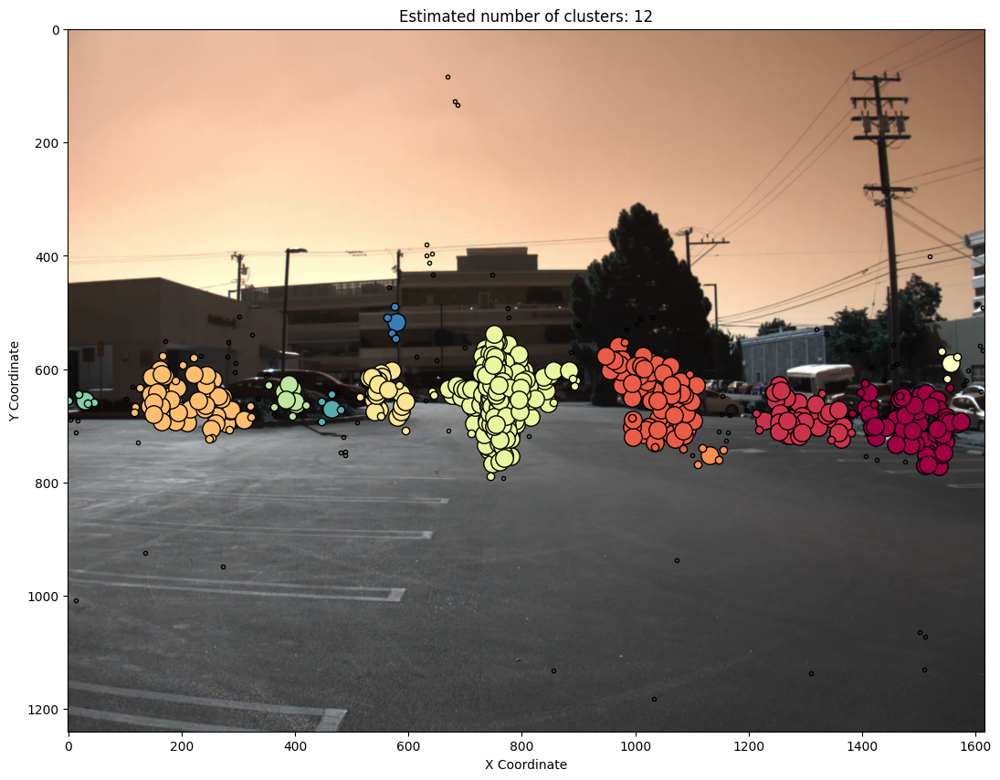

In [80]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from sklearn import metrics
from src.data.dataset import Scene, CameraRadarProps
from src.radar_to_image import multi_radar_to_img

LEFT_CAM = '21248038'
MID_CAM = '20438665'
RIGHT_CAM = '21248039'

LEFT_RADAR = 'ZRVE1002'
MID_RADAR = 'ZRVC2001'
RIGHT_RADAR = 'ZRVE1001'

filepath = 'data/00000.npz'
sensor_prop_path = 'data/extrinsics_intrinsics.npz'

if __name__ == '__main__':

    # Load the data
    data = Scene(filepath)
    sensor_props = CameraRadarProps(sensor_prop_path)

    # Get radar and camera data
    radar_data = data.get_radar_data()
    camera_data = data.get_camera_data()
    cam = MID_CAM

    # Get all radar points transformed to image coordinates
    all_radar = multi_radar_to_img(
        radar_data,
        sensor_props.radar_extrinsic, 
        sensor_props.camera_extrinsics[cam], 
        sensor_props.camera_intrinsics[cam],
        image=camera_data[cam]
    )

    # Concatenate all radar points into a single array
    X = np.concatenate((all_radar['ZRVE1001'], all_radar['ZRVE1002'], all_radar['ZRVC2001']))

    # Apply DBSCAN clustering algorithm
    db = DBSCAN(eps=30, min_samples=5).fit(X)
    labels = db.labels_

    # Calculate and print the Silhouette Coefficient
    silhouette_score = metrics.silhouette_score(X, labels)
    print(f"Silhouette Coefficient: {silhouette_score:.3f}")

    # Calculate the number of clusters (excluding noise) and noise points
    n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
    n_noise_ = list(labels).count(-1)

    # Print the estimated number of clusters and noise points
    print(f"Estimated number of clusters: {n_clusters_}")
    print(f"Estimated number of noise points: {n_noise_}")

    # Initialize core samples mask
    core_samples_mask = np.zeros_like(labels, dtype=bool)
    core_samples_mask[db.core_sample_indices_] = True

    # Generate unique colors for each cluster
    unique_labels = set(labels)
    colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]

    # Convert the image data to float32 and normalize
    camera_image = camera_data[cam].astype(np.float32) / 255.0

    # Plot the image and overlay the clustered radar points
    plt.figure(figsize=(20, 10))
    plt.imshow(camera_image)
    plt.title(f"Estimated number of clusters: {n_clusters_}")
    plt.xlabel('X Coordinate')
    plt.ylabel('Y Coordinate')

    # Plot each cluster with different color
    for k, col in zip(unique_labels, colors):
        if k == -1:
            # Black used for noise.
            col = [0, 0, 0, 0]
            marker = '.'
        else:
            marker = 'o'
        
        class_member_mask = labels == k

        # Plot core samples
        xy = X[class_member_mask & core_samples_mask]
        plt.plot(
            xy[:, 0], xy[:, 1], marker,
            markerfacecolor=tuple(col),
            markeredgecolor='k',
            markersize=14
        )

        # Plot non-core samples
        xy = X[class_member_mask & ~core_samples_mask]
        plt.plot(
            xy[:, 0], xy[:, 1], marker,
            markerfacecolor=tuple(col),
            markeredgecolor='k',
            markersize=6
        )

    # Invert the y-axis of the image

    # Display 


# 3D clusters for concatenated radar

In [89]:
# DEFINE INTERMEDIATE FUNCTIONS TO CONVERT RADAR 3D POINTS TO CAMERA 3D POINTS AND THEN TO IMAGE 2D POINTS

### single_radar_to_img is split into these 2 functions

def single_radar_to_camera(radar_pt, radar_extrinsics, camera_extrinsics):
    """
    Converts radar points from radar coordinates to camera coordinates.
    
    Parameters:
    radar_pt (numpy.ndarray): Radar points in radar coordinates.
    radar_extrinsics (numpy.ndarray): Extrinsic parameters of the radar.
    camera_extrinsics (numpy.ndarray): Extrinsic parameters of the camera.
    
    Returns:
    numpy.ndarray: Radar points transformed to camera coordinates.
    """
    radar_vehicle = radar_to_vehicle(radar_pt, radar_extrinsics)
    camera_coor = vehicle_to_camera(radar_vehicle, camera_extrinsics)
    return camera_coor

def single_camera_to_img(camera_coor, camera_intrinsics):
    """
    Converts camera coordinates to image coordinates.
    
    Parameters:
    camera_coor (numpy.ndarray): Points in camera coordinates.
    camera_intrinsics (numpy.ndarray): Intrinsic parameters of the camera.
    
    Returns:
    numpy.ndarray: Points transformed to image coordinates.
    """
    image_coor = camera_to_image(camera_coor, camera_intrinsics)
    return image_coor

### Split the multifunction
def multi_radar_to_camera(radar_pts, radar_extrinsics, camera_extrinsics, camera_intrinsics):
    """
    Converts multiple sets of radar points from radar coordinates to camera coordinates.
    
    Parameters:
    radar_pts (dict): Dictionary of radar points for different radars.
    radar_extrinsics (dict): Dictionary of extrinsic parameters for each radar.
    camera_extrinsics (numpy.ndarray): Extrinsic parameters of the camera.
    camera_intrinsics (numpy.ndarray): Intrinsic parameters of the camera.
    
    Returns:
    dict: Dictionary of radar points transformed to camera coordinates for each radar.
    """
    all_camera = {}
    for id, radar_pt in radar_pts.items():
        camera_coor = single_radar_to_camera(radar_pt, radar_extrinsics[id], camera_extrinsics)
        all_camera[id] = camera_coor
    return all_camera

def multi_camera_to_img(all_camera, camera_intrinsics):
    """
    Converts multiple sets of camera coordinates to image coordinates.
    
    Parameters:
    all_camera (dict): Dictionary of points in camera coordinates for different radars.
    camera_intrinsics (numpy.ndarray): Intrinsic parameters of the camera.
    
    Returns:
    dict: Dictionary of points transformed to image coordinates for each radar.
    """
    all_radar = {}
    for id, radar_pt in all_camera.items():
        image_coor = single_camera_to_img(radar_pt, camera_intrinsics)
        all_radar[id] = image_coor
    
    return all_radar

    

In [90]:
# TRANSFORM RADAR 3D DATA TO CAMERA 3D

# Define camera and radar identifiers
LEFT_CAM = '21248038'
MID_CAM = '20438665'
RIGHT_CAM = '21248039'

LEFT_RADAR = 'ZRVE1002'
MID_RADAR = 'ZRVC2001'
RIGHT_RADAR = 'ZRVE1001'

# Define file paths for data and sensor properties
filepath = 'data/00000.npz'
sensor_prop_path = 'data/extrinsics_intrinsics.npz'

if __name__ == '__main__':
    # Load the scene data from the file
    data = Scene(filepath)
    # Load the sensor properties (extrinsics and intrinsics)
    sensor_props = CameraRadarProps(sensor_prop_path)

    # Retrieve radar data and camera data from the scene
    radar_data = data.get_radar_data()
    camera_data = data.get_camera_data()
    cam = MID_CAM  # Select the middle camera for transformation

    # Transform radar points to camera coordinates for all radars
    all_camera = multi_radar_to_camera(
        radar_data,
        sensor_props.radar_extrinsic,
        sensor_props.camera_extrinsics[cam],
        sensor_props.camera_intrinsics[cam]
    )

    # 'all_camera' now contains the radar points transformed to camera coordinates


Loading data for: data/00000.npz
Loading camera frames.


In [95]:
# Run DBSCAN on the combined radar point cloud and maximize the silhouette coefficient

# Assuming all_camera is a dictionary with keys 'ZRVE1001', 'ZRVE1002', 'ZRVC2001'
X = all_camera
X = np.concatenate((X['ZRVE1001'], X['ZRVE1002'], X['ZRVC2001']))

# Define a grid of parameters for DBSCAN
eps_values = np.arange(0.1, 5, 0.2)  # Adjust the range and step as needed
min_samples_values = range(2, 6)  # Adjust the range and step as needed

best_score = -1  # Initialize the best silhouette score
best_eps = None  # Initialize the best epsilon value
best_min_samples = None  # Initialize the best min_samples value

# Grid search to find the best parameters for DBSCAN
for eps in eps_values:
    for min_samples in min_samples_values:
        db = DBSCAN(eps=eps, min_samples=min_samples).fit(X)  # Apply DBSCAN
        labels = db.labels_  # Get the labels assigned by DBSCAN

        n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)  # Count the number of clusters
        if n_clusters_ == 0:
            continue  # Skip if no clusters are found

        silhouette_score = metrics.silhouette_score(X, labels)  # Calculate the silhouette score
        if silhouette_score > best_score:
            best_score = silhouette_score  # Update the best silhouette score
            best_eps = eps  # Update the best epsilon value
            best_min_samples = min_samples  # Update the best min_samples value

# Apply DBSCAN using the best found parameters
db = DBSCAN(eps=best_eps, min_samples=best_min_samples).fit(X)
labels = db.labels_

# Print the best silhouette score and parameters
print(f"Silhouette Coefficient: {best_score:.3f}")
print(f"Best eps: {best_eps}")
print(f"Best min_samples: {best_min_samples}")

# Calculate the number of clusters and noise points
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

# Print the estimated number of clusters and noise points
print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)


Silhouette Coefficient: 0.511
Best eps: 2.900000000000001
Best min_samples: 3
Estimated number of clusters: 60
Estimated number of noise points: 58


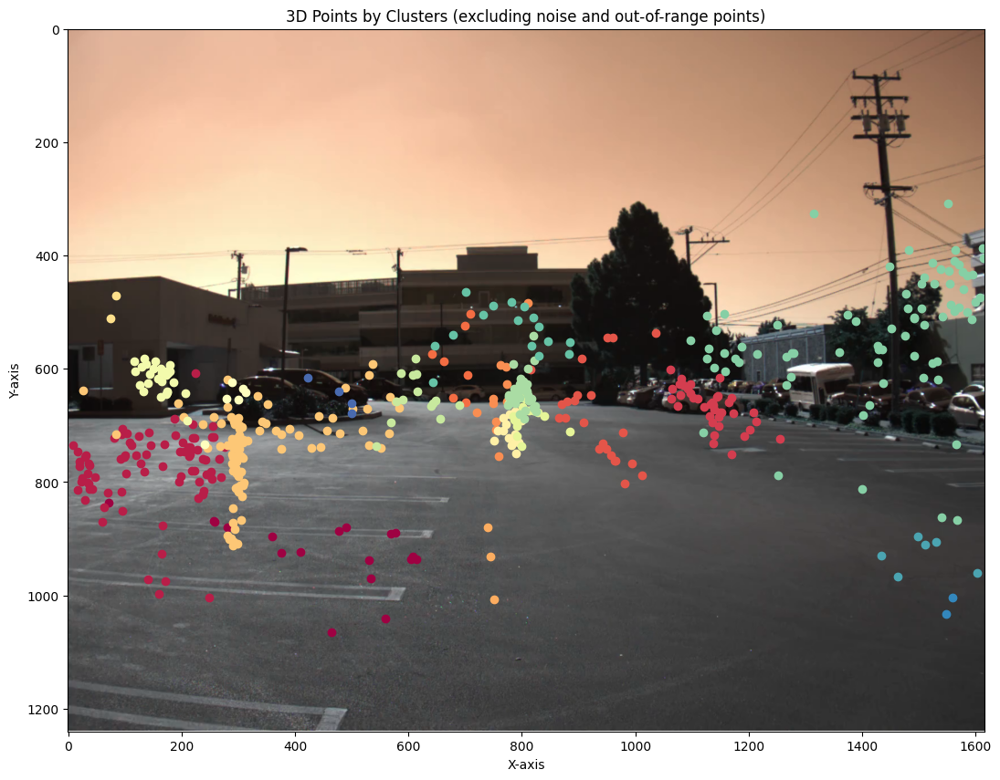

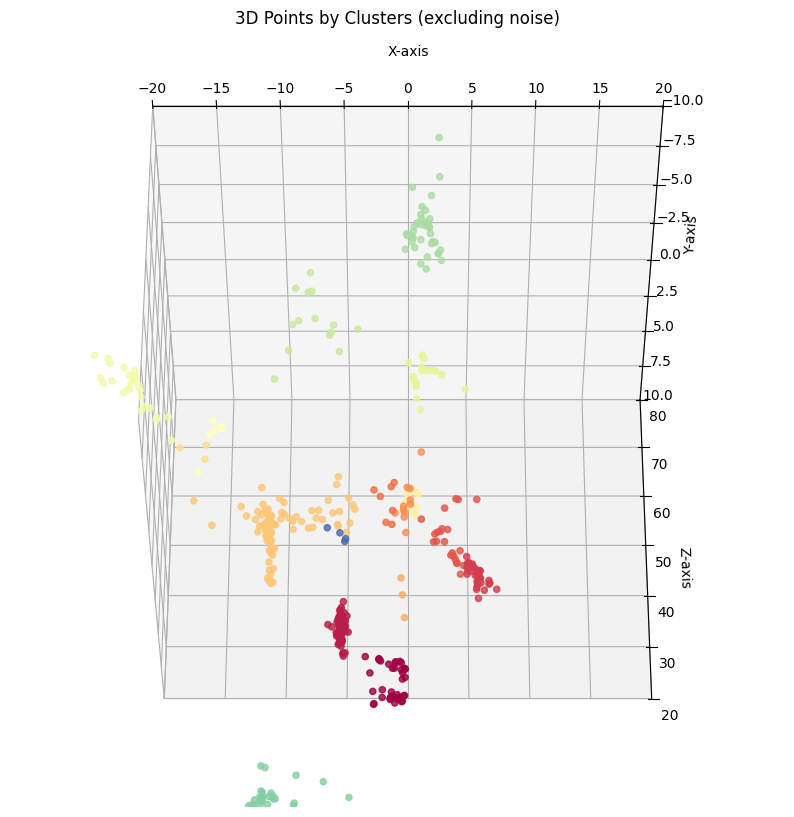

In [96]:
# Transform 3D CAMERA to 2D IMAGE
all_image = multi_camera_to_img(all_camera, sensor_props.camera_intrinsics[cam])
all_image = np.concatenate((all_image['ZRVE1001'], all_image['ZRVE1002'], all_image['ZRVC2001']))

# 2D PLOT
# Filters out the points which are not in the camera frame
points = all_image

filtered_indices = np.where((0 < points[:, 0]) & (points[:, 0] < 1616) & (0 < points[:, 1]) & (points[:, 1] < 1240))
filtered_points = points[filtered_indices]
filtered_labels = np.array(labels)[filtered_indices]

unique_labels = set(filtered_labels)
colors = plt.cm.Spectral(np.linspace(0, 1, len(unique_labels)))

# Convert the image data to float32 and normalize if necessary
camera_image = camera_data[cam].astype(np.float32) / 255.0

plt.figure(figsize=(20, 10))
plt.imshow(camera_image)

for label, col in zip(unique_labels, colors):
    if label == -1:
        continue  # Skip noise points (label = -1)
        
    cluster_points = filtered_points[filtered_labels == label]
    x, y = cluster_points[:, 0], cluster_points[:, 1]

    plt.scatter(x, y, color=[col], label=f'Cluster {label}')

plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.title('3D Points by Clusters (excluding noise and out-of-range points)')

plt.ylim(0, 1240)
ax = plt.gca()
ax.invert_yaxis()

plt.show()

# PLOT 3D CLUSTERS WITH SAME COLORS AS ABOVE

from mpl_toolkits.mplot3d import Axes3D

# Separate points and labels into two lists
points = X

# Create a 3D scatter plot
fig = plt.figure(figsize=(10, 20))
ax = fig.add_subplot(111, projection='3d')

# Plot each cluster with a different color
for label, col in zip(unique_labels, colors):
    if label == -1:
        continue  # Skip noise points

    cluster_points = points[labels == label]
    x, y, z = cluster_points[:, 0], cluster_points[:, 1], cluster_points[:, 2]

    ax.scatter(x, y, z, color=[col], label=f'Cluster {label}', alpha=0.8)

# Set axis labels
ax.set_xlabel('X-axis')
ax.set_ylabel('Y-axis')
ax.set_zlabel('Z-axis')
plt.title('3D Points by Clusters (excluding noise)')

# Set the viewing angle
ax.view_init(elev=-35, azim=-90)

# Set axis limits
ax.set_xlim(-20, 20)
ax.set_ylim(-10, 10)
ax.set_zlim(20, 80)

# Display the plot
plt.show()
